In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

In [2]:
SAMPLE_PATH = "data/extract.csv"
path_nta = "data/Neighborhood Tabulation Areas.geojson"
path_nta_population = "data/New_York_City_Population_By_Neighborhood_Tabulation_Areas.csv"

In [3]:
df = pd.read_csv(SAMPLE_PATH)

/usr/lib/python3/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (8) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [4]:
df.columns

Index(['Unique Key', 'Created Date', 'Closed Date', 'Agency', 'Agency Name',
       'Complaint Type', 'Descriptor', 'Location Type', 'Incident Zip',
       'Incident Address', 'Street Name', 'Cross Street 1', 'Cross Street 2',
       'Intersection Street 1', 'Intersection Street 2', 'Address Type',
       'City', 'Landmark', 'Facility Type', 'Status', 'Due Date',
       'Resolution Description', 'Resolution Action Updated Date',
       'Community Board', 'BBL', 'Borough', 'X Coordinate (State Plane)',
       'Y Coordinate (State Plane)', 'Open Data Channel Type',
       'Park Facility Name', 'Park Borough', 'Vehicle Type',
       'Taxi Company Borough', 'Taxi Pick Up Location', 'Bridge Highway Name',
       'Bridge Highway Direction', 'Road Ramp', 'Bridge Highway Segment',
       'Latitude', 'Longitude', 'Location'],
      dtype='object')

In [5]:
df.shape

(20000, 41)

We check that the Unique Key truly is unique, and that no NaN's appear in the column.

In [6]:
assert df["Unique Key"].is_unique
assert not df["Unique Key"].isnull().values.any()

In [7]:
for c in df.columns:
    if "Date" in c:
        print("Converting", c)
        df[c] = pd.to_datetime(df["Created Date"])

Converting Created Date
Converting Closed Date
Converting Due Date
Converting Resolution Action Updated Date


In [8]:
df["Created Day"] = df["Created Date"].apply(lambda d: d.day)
df["Created Month"] = df["Created Date"].apply(lambda d: d.month)
df["Created Year"] = df["Created Date"].apply(lambda d: d.year)

In [9]:
def heatbarplot(value_counts):
    max_v = value_counts.max()
    min_v = value_counts.min()
    clrs = {k:np.array([(v-min_v)/(max_v-min_v), 0., 0.]) for k, v in zip(value_counts.keys(), value_counts.values)}
    sns.barplot(x=value_counts.keys(), y=value_counts.values, palette=clrs)

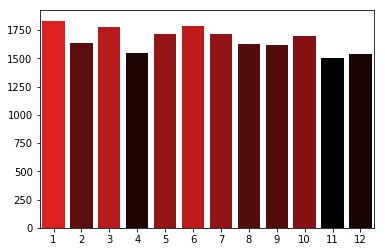

In [10]:
heatbarplot(df["Created Month"].value_counts())

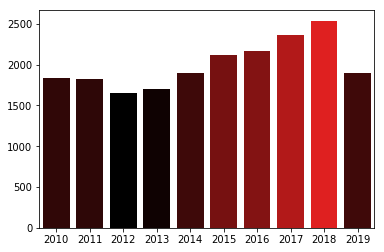

In [11]:
heatbarplot(df["Created Year"].value_counts())

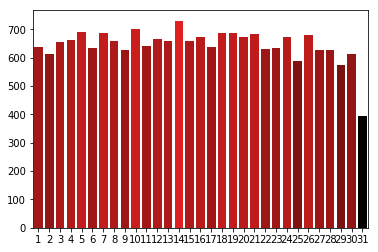

In [12]:
heatbarplot(df["Created Day"].value_counts())

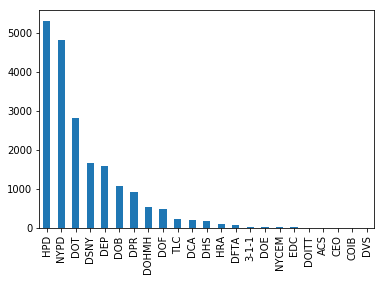

In [13]:
df["Agency"].value_counts().plot.bar()

In [14]:
ct_vcs = df["Complaint Type"].value_counts()
ct_vcs.shape

(207,)

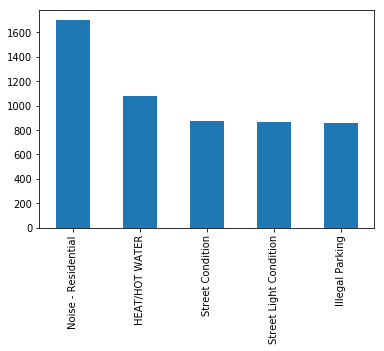

In [15]:
ct_vcs.head().plot.bar()

In [16]:
import folium


In [17]:
def plotpts(geodf, color="#ff0000", popup="None"):
    clean = geodf[geodf["Latitude"].notnull()]
    clean = clean[clean["Longitude"].notnull()]
    m = folium.Map(location=[clean["Latitude"].values[0], clean["Longitude"].values[0]], zoom_start=10)
    #for c in zip(clean["Latitude"].values, clean["Longitude"].values):
    for i, row in clean.iterrows():
        folium.CircleMarker(location=(row["Latitude"], row["Longitude"]),
                            radius= 1,
                            color=color(row) if callable(color) else color,
                            popup=popup(row) if callable(popup) else popup,
                            fill=True).add_to(m)
    return m
plotpts(df[df["Complaint Type"] == "Noise - Residential"])

In [18]:
cfun = lambda row: "#aa3300" if row["Complaint Type"] == "Noise - Residential" else \
"#00aa33" if row["Complaint Type"] == "Street Condition" else \
"#aa0066" if row["Complaint Type"] == "Street Light Condition" else \
"#cccc00" if row["Complaint Type"] == "HEAT/HOT WATER" else \
"#3300aa" if row["Complaint Type"] == "Illegal Parking" else "#444444"
popup = lambda row: str(popup)
df2k = df.sample(n=2000, random_state=1)
plotpts(df2k, color=cfun, popup=popup)

In [19]:
print("Out of", df.shape[0], "entries:")
facility_df = df[df["Facility Type"].notnull()]
print(facility_df.shape[0], "have associated facility type.")
facility_df["Facility Type"].value_counts()

Out of 20000 entries:
5112 have associated facility type.


Precinct       4425
DSNY Garage     669
School           18
Name: Facility Type, dtype: int64

We have 3 disctinct associated facility type. Mostly Precinct, then DSNY Garage then a few School.

In [20]:
df["Open Data Channel Type"].value_counts()

PHONE      10297
UNKNOWN     4971
ONLINE      3139
MOBILE      1277
OTHER        316
Name: Open Data Channel Type, dtype: int64

In [21]:
df["Status"].value_counts()

Closed         18997
Pending          444
Open             312
Assigned         137
In Progress       97
Started            8
Email Sent         5
Name: Status, dtype: int64

In [27]:
df["Borough"].value_counts()

BROOKLYN         5873
QUEENS           4593
MANHATTAN        4017
BRONX            3380
Unspecified      1117
STATEN ISLAND    1020
Name: Borough, dtype: int64

In [22]:
df2k = df.sample(n=2000, random_state=1)

In [23]:
cfun = lambda row: "#00cc00" if row["Status"] == "Closed" else \
"#cccc00" if row["Status"] == "Pending" else \
"#cc0000" if row["Status"] == "Open" else \
"#0000cc" if row["Status"] == "Assigned" else "#444444"
popup = lambda row: str(row)
plotpts(df2k, color=cfun, popup=popup)

Lead: analyse precinct efficiency, "time to solve", "solving rate"

In [24]:
df["Vehicle Type"].value_counts()

Car Service                8
Ambulette / Paratransit    1
Name: Vehicle Type, dtype: int64

In [25]:
df["Descriptor"].describe()

count                19791
unique                 751
top       Loud Music/Party
freq                  1711
Name: Descriptor, dtype: object

In [26]:
df["Descriptor"].value_counts()

Loud Music/Party                                    1711
HEAT                                                 791
ENTIRE BUILDING                                      712
Street Light Out                                     618
No Access                                            574
Pothole                                              534
Banging/Pounding                                     470
APARTMENT ONLY                                       365
CEILING                                              296
Request Large Bulky Item Collection                  273
Loud Talking                                         252
MOLD                                                 234
Controller                                           228
Posted Parking Sign Violation                        226
With License Plate                                   218
Partial Access                                       208
PESTS                                                199
14 Derelict Vehicles           

Neighborhood rating system, show subscores for:

- noise disturbance (banging/pounding, loud party etc.)
- infrastructure condition (pothole descriptor, road condition/street light condition etc.)
- private residence condition (rat sighting, vermin, mold, etc.)
- safety (mix with 911?)

and create a general index too. mix with property prices to find overvalued/undervalued properties with predictive model